#### Inspired by the work of:

https://medium.com/@tuennermann/convolutional-neural-networks-to-find-cars-43cbc4fb713

https://github.com/HTuennermann/Vehicle-Detection-and-Tracking

https://github.com/heuritech/convnets-keras

https://github.com/maxritter/SDC-Vehicle-Lane-Detection

#### 1. Config

In [1]:
# Visualisation parameters
display_output = 1

#### 2. Load test images

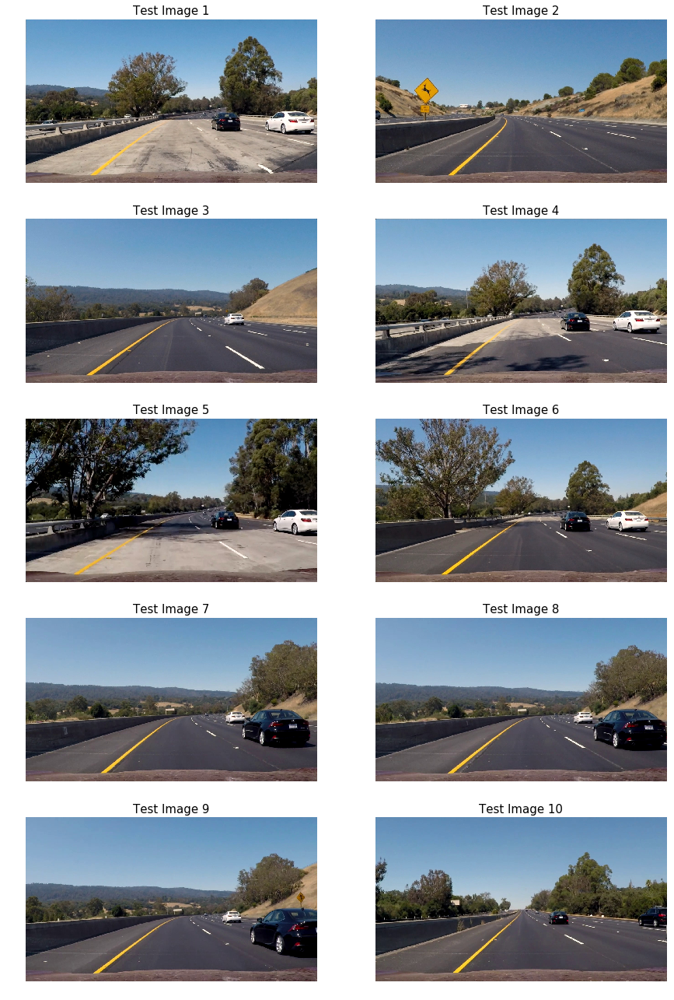

In [2]:
if display_output == 1:
    import matplotlib.image as mpimg
    import matplotlib.pyplot as plt
    %matplotlib inline
    
    my_dpi = 94
    aspect_ratio = 16/9
    
    x_pix = 1200  # x dimension of resulting figure 
    col_num = 2
    test_img_num = 10
    
    row_num = int(test_img_num/col_num)

    img = {}
    f, ax = plt.subplots(row_num, col_num, 
                         figsize=(x_pix/my_dpi, x_pix/col_num*row_num/aspect_ratio/my_dpi))

    for i in range(test_img_num):
        img[i] = mpimg.imread('test_images/test' + str(i+1) + '.jpg')
        ax[int(i/col_num), i % col_num].imshow(img[i])
        ax[int(i/col_num), i % col_num].set_title('Test Image ' + str(i+1), fontsize=15)
        ax[int(i/col_num), i % col_num].axis('off')

    f.tight_layout()
    plt.savefig("./output_images/test_images.png", dpi=my_dpi)

#### 3. Plot regions of interest on test images

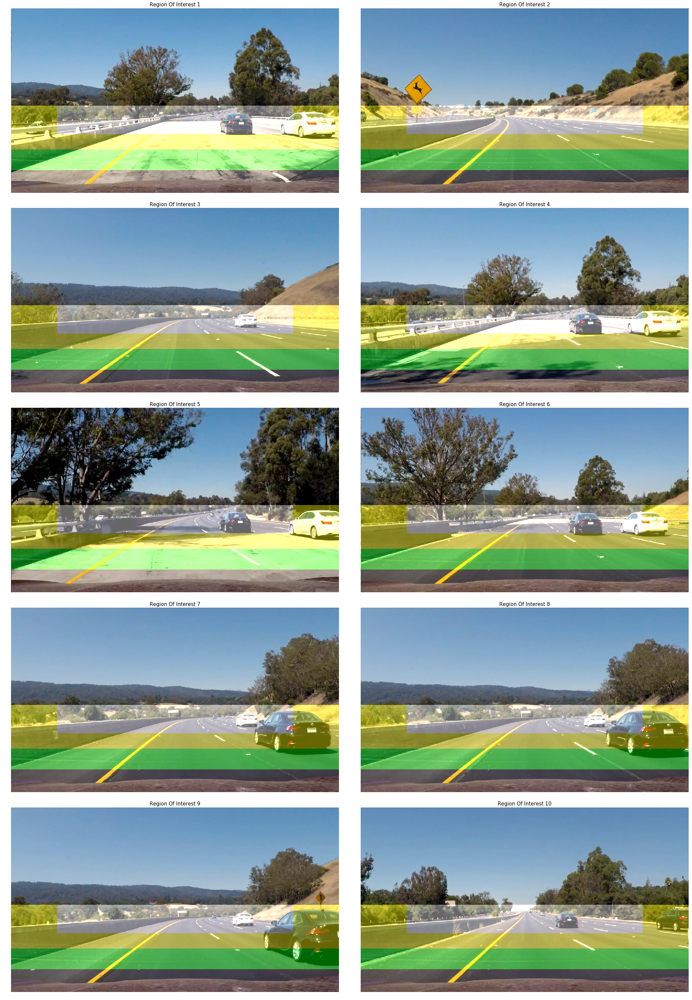

In [3]:
import numpy as np

h = 720
w = 1280 

# Region of interest #1
upper_left_roi_1 = (0, 380)
lower_right_roi_1 = (1280, 630)

# Region of interest #2
upper_left_roi_2 = (0, 380)
lower_right_roi_2 = (1280, 550)

# Region of interest #3
upper_left_roi_3 = (180, 380)
lower_right_roi_3 = (1100, 490)

# ROIs (global variable)
rois = [(upper_left_roi_1, lower_right_roi_1),
        (upper_left_roi_2, lower_right_roi_2),
        (upper_left_roi_3, lower_right_roi_3)]

# Approx Car Height in each ROI (mesured manualy on this cell's output image)
car_h_1 = 180  #px
car_h_2 = 80  #px
car_h_3 = 50  #px

# Training dataset approx avg car height
car_h_train = 62 #px

# Dataset dimension
dataset_h = 64
dataset_w = 64

# ROI scaling factors (global variable)
scaling_roi = [ car_h_train/car_h_1,   # 62/180 = 0.34  / 0.5
                car_h_train/car_h_2,   # 62/100 = 0.62  / 1.2
                car_h_train/car_h_3 ]  # 62/50  = 1.24  / 2.0

# scaling_roi = [ 0.5,   
#                 1.2,
#                 2.0 ]

color = [(0,255,0),(255,0,0),(0,0,255)]

def draw_roi(img, roi, color):
    overlay1 = np.zeros_like(img).astype(np.uint8)
    cv2.rectangle(overlay1, roi[0], roi[1], color, -1)
    img_result = cv2.addWeighted(img, 1, overlay1, 0.4, 0)
    return img_result

def pipeline_roi(img):
    for i in range(len(rois)):
        img = draw_roi(img, rois[i], color[i])
    return img

if display_output == 1:
    import cv2
    
#     x_pix = 1200  # x dimension of the resulting figure
    
    x_pix = 2785 # 1:1 ratio images
    col_num = 2
    
    row_num = int(test_img_num/col_num)

    # Plot the result of applying the pipeline of undistorded images
    f, ax = plt.subplots(row_num, col_num, 
                         figsize=(x_pix/my_dpi, x_pix/col_num*row_num/aspect_ratio/my_dpi))

    for i in range(test_img_num):
        
        # Create an image to draw the ROI on
        img_result = pipeline_roi(img[i])

        ax[int(i/col_num), i % col_num].imshow(img_result)
        ax[int(i/col_num), i % col_num].set_title('Region Of Interest ' + str(i+1), fontsize=15)
        ax[int(i/col_num), i % col_num].axis('off')

    f.tight_layout()

    plt.savefig("./output_images/ROI.png", dpi=my_dpi)

#### 4. Use the trained classifier as a heatmap model
Since the model is made exclusively of convolution layers I do not need to actually specify image dimensions. By not adding the flatten() layer in the end, the output will be a feature map (heat map).

In [4]:
from model import get_model

# Get the "base" (without flatten layer) ConvNet Model
heatmodel = get_model(input_shape=(None, None, 3))

# Print out model summary
if display_output == 1:
    heatmodel.summary()

Using TensorFlow backend.


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lambda_1 (Lambda)            (None, None, None, 3)     0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, None, None, 128)   3584      
_________________________________________________________________
dropout_1 (Dropout)          (None, None, None, 128)   0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, None, None, 128)   147584    
_________________________________________________________________
dropout_2 (Dropout)          (None, None, None, 128)   0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, None, None, 128)   147584    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, None, None, 128)   0         
__________

#### 5. Load the classifier weights

In [5]:
# Load the weight
heatmodel.load_weights('./weights/best-weights.hdf5')
print("Weights loaded!")

Weights loaded!


#### 6. Lesson provided functions

In [9]:
from scipy.ndimage.measurements import label

def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

#### 7. Generate heat maps on the test images

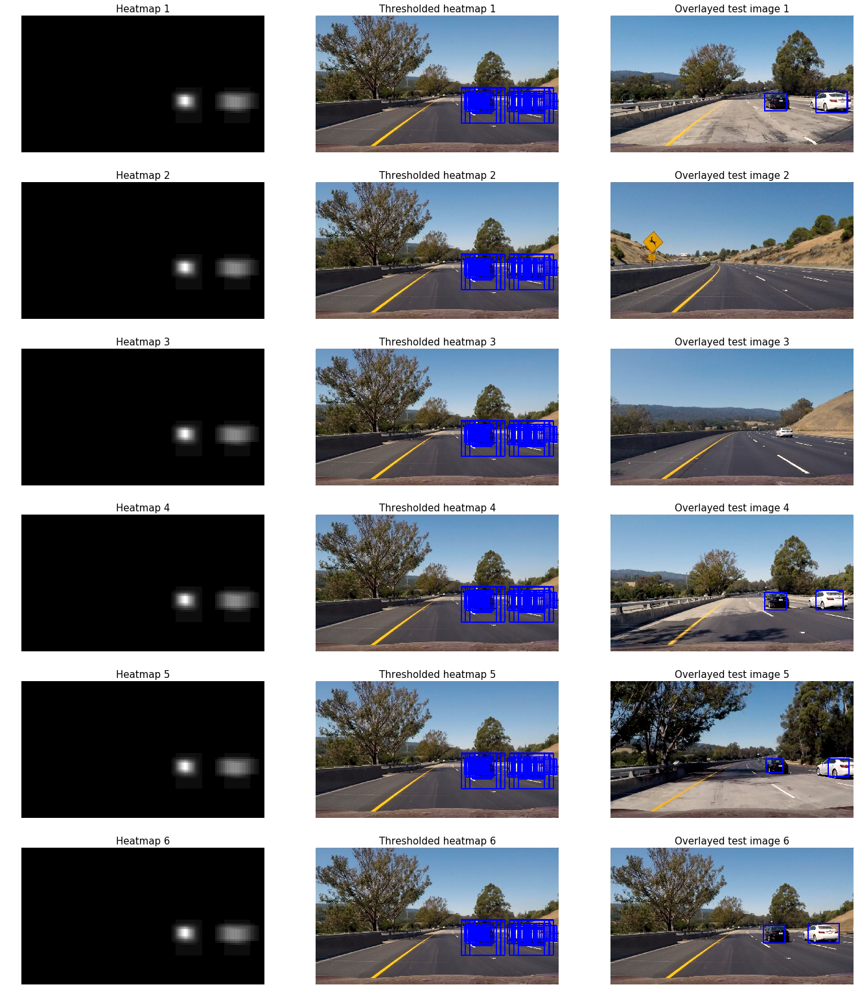

In [18]:
import cv2
import time
import collections

# Classification threshold
class_threshold  = 0.995

# heatmap history lenght
heatmap_history_lenght = 5

# heat map threshold
heat_map_threshold = 2

# Declare a stack of heatmaps (stores the heatmap history)
heatmaps = collections.deque(maxlen=heatmap_history_lenght)


def find_hot_windows(heatmap, hot_windows, scaling, roi):
    # Returns the heatmap's coordinate matrices
    xx, yy = np.meshgrid(np.arange(heatmap.shape[2]), np.arange(heatmap.shape[1]))
    # Returns the hot pixels coordinates in x and y vectors
    x = (xx[heatmap[0,:,:,0] > class_threshold])
    y = (yy[heatmap[0,:,:,0] > class_threshold])

    # Scales hot window bounding box width and height
    hot_w_w = int(dataset_w/scaling)
    hot_w_h = int(dataset_h/scaling)
    
    # For each heatmap hotpixel coordinate in x,y vector, create the hot window upper_left and 
    # lower_right coordinate for the original image pixel space and append to the hot_windows list
    for i, j in zip(x, y):
        xpos = int((i*8)/scaling) + roi[0][0]   # int(coord_x/scaling  * (neural net scale down)) + crop_xmin
        ypos = int((j*8)/scaling) + roi[0][1]   # int(coord_y/scaling  * (neural net scale down)) + crop_ymin
        hot_windows.append(((xpos, ypos), (xpos + hot_w_w, ypos + hot_w_h)))

def heatmap_infer(image):
    # Empty list of cropped images
    cropped = []          # List of cropped down to ROI images
    resized = []          # List of resized ROI
    heatmap_infered = []  # List of inference output
    heatmap = np.zeros_like(image[:,:,0]).astype(np.float)
    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    hot_windows = []      # Hot windows list

    # Copy the image
    img = image.copy()
    
    # For all the ROIs...
    for i in range(len(rois)):
        # Crop image along specified ROIs (cells above)
        cropped.append(img[rois[i][0][1]:rois[i][1][1],rois[i][0][0]:rois[i][1][0]])
        
        # Resize the cropped image to fit the classifier trained scale
        resized.append(cv2.resize(cropped[i], None, fx=scaling_roi[i],
                                  fy=scaling_roi[i], interpolation=cv2.INTER_AREA))
   
        # Infere the heatmaps (Add one dimension to the image to fit the CNN input shape...)
        heatmap_infered.append(heatmodel.predict(resized[i].reshape(1,resized[i].shape[0],resized[i].shape[1],resized[i].shape[2])))
        
        # Find hot windows
        find_hot_windows(heatmap_infered[i], hot_windows, scaling_roi[i], rois[i])
        
    # Add heat for each hot window in the list
    heat = add_heat(heat, hot_windows)

    # Add the heatmap on the stack (when full, the oldest heatmap is discarded)
    heatmaps.append(heat)
    heatmaps_sum = sum(heatmaps)
    
    # Apply threshold to help remove false positives
    heatmaps_sum = apply_threshold(heatmaps_sum, heatmap_history_lenght*heat_map_threshold)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heatmaps_sum, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(image), labels)   
    
    # Draw the list windows over the original image
    for (upper_left, lower_right) in hot_windows:
        cv2.rectangle(img, upper_left, lower_right, (0,0,255), 5)
    
    return draw_img

if display_output == 1:
    
    x_pix = 1800  # x dimension of the resulting figure 
    col_num = 3
    test_img_num = 6
    
    row_num = 6
    
    # Plot the result of applying the pipeline of undistorded images
    f, ax = plt.subplots(row_num, col_num, 
                         figsize=(x_pix/my_dpi, x_pix/col_num*row_num/aspect_ratio/my_dpi))

    for i in range(test_img_num):
        
        heatmaps.clear()
#         channel,   \
#         binary,    \
        img_result = heatmap_infer(img[i])
        
        ax[i, 0].imshow(channel, cmap="gray")
        ax[i, 0].set_title('Heatmap ' + str(i+1), fontsize=15)
        ax[i, 0].axis('off')
        
        ax[i, 1].imshow(binary, cmap="gray")
        ax[i, 1].set_title('Thresholded heatmap ' + str(i+1), fontsize=15)
        ax[i, 1].axis('off')
        
        ax[i, 2].imshow(img_result)
        ax[i, 2].set_title('Overlayed test image ' + str(i+1), fontsize=15)
        ax[i, 2].axis('off')

    f.tight_layout()

    plt.savefig("./output_images/heatmaps.png", dpi=my_dpi)


#### Test Video Processing

In [19]:
### test heatmap on video

from moviepy.editor import VideoFileClip
from IPython.display import HTML

heatmaps.clear()
project_output = './output_videos/test_video_output.mp4'
clip1 = VideoFileClip("test_video.mp4")
project_clip = clip1.fl_image(heatmap_infer) #NOTE: this function expects color images!!
%time project_clip.write_videofile(project_output, audio=False)

[MoviePy] >>>> Building video ./output_videos/test_video_output.mp4
[MoviePy] Writing video ./output_videos/test_video_output.mp4


 97%|█████████▋| 38/39 [00:10<00:00,  3.51it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_videos/test_video_output.mp4 

CPU times: user 20.3 s, sys: 1.66 s, total: 21.9 s
Wall time: 11.6 s


#### Project Video Processing

In [20]:
### test heatmap on video

from moviepy.editor import VideoFileClip
from IPython.display import HTML

heatmaps.clear()
project_output = './output_videos/project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4")
project_clip = clip1.fl_image(heatmap_infer) #NOTE: this function expects color images!!
%time project_clip.write_videofile(project_output, audio=False)


[MoviePy] >>>> Building video ./output_videos/project_video_output.mp4
[MoviePy] Writing video ./output_videos/project_video_output.mp4


100%|█████████▉| 1260/1261 [06:10<00:00,  3.07it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_videos/project_video_output.mp4 

CPU times: user 12min 11s, sys: 1min, total: 13min 11s
Wall time: 6min 11s


# trucs pour sanity check:!!!
* color
* position in the image
* shape
* apparent size

# sortir la lane pipeline
# faire le tracking



#### Create a tracker class

I found the reference to this tracker class in the Slack #p-vehicle-detection channel pinned items. 
Kyle Stewart-Frantz, Admin for Self-Driving Car Nanodegree, made it available to us.
https://github.com/kylesf/object-tracker/blob/master/python/object_tracker.py

In [ ]:
# Object Tracker
# Goal is to build the ultimate object tracker for vehicles, people, signs and other relevant information

##### Globals needed ######
global cars
###########################


class Object:
    def __init__(self,position):
        self.position = position
        self.new_postion = None
        self.count = 0
        self.frame = 1
        self.flag = False
        self.long_count = 0
        self.postion_average = []

    def update(self,temp_position):
        if abs(temp_position[2]-self.position[2]) < 100 and abs(temp_position[3]-self.position[3]) < 100:
            if self.long_count > 2:
                self.postion_average.pop(0)
                self.postion_average.append(temp_position)
                self.new_postion = np.mean(np.array(self.postion_average), axis=0).astype(int)
                self.position = self.new_postion
                self.frame = 1
                self.count += 1

                return False

            self.position = temp_position
            self.postion_average.append(temp_position)
            self.count+=1

            return False

        else:
            return True

    def get_position(self):
        self.frame+=1
        if self.count == 7 and self.long_count < 3 :
            self.new_postion = np.mean(np.array(self.postion_average), axis=0).astype(int)
            self.count = 0
            self.frame = 1
            self.long_count += 1
            if self.long_count < 2:
                self.postion_average = []

        if self.frame > 10:
            self.flag = True

        return self.new_postion, self.flag

class Vehicle(Object):
     def __init__(self, position):
        Object.__init__(self, position)

class Person(Object):
    def __init__(self, position):
        Object.__init__(self, position)

class Sign(Object):
    def __init__(self, position):
        Object.__init__(self, position)
        self.label = None
        run_network()
    def run_network(self):
        # Crop out position and run through sign network
        # update self.label




# Takes in a list of calculated centroids calculated from current frame from your own code  (both good and bad)

# Deal with car tracking
for centroid in img_centroids:
    new = True
    for car in cars:
        new = car.update(centroid)
        if new == False:
            break
    if new == True:
        cars.append(Vehicle(centroid))

next_cars = []
positions = []

for car in cars:
    position, flag = car.get_position()
    if flag == False:
        next_cars.append(car)
    positions.append(position)

cars = next_cars

# Outputs current relevant positions.

try:
    for (x1, y1, x2, y2) in positions:
        cv2.rectangle(clone, (x1, y1), (x2, y2), (255, 0, 0), thickness=2)
except:
    pass

#### Lane finding pipeline